<h1 style="font-size: 48px; color: #336699; font-weight: bold;">Diabetes Prediction Model</h1>

<h2 style="font-family: 'Times New Roman', serif; color: #336699; font-weight: bold;">Data Overview and Cleaning</h2>

<h3 style="color: #336699; font-weight: bold;">1.1 Import Necessary Libraries</h3>

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
import plotly.express as px
import plotly.graph_objects as go

<h3 style="color: #336699; font-weight: bold;">1.2 Load the Dataset</h3>

In [7]:
# Load the dataset
df = pd.read_csv('diabetes_dataset00.csv')


<h3 style="color: #336699; font-weight: bold;">1.3 Quick Data Overview</h3>

In [9]:
print(df.shape)  # Check the shape of the dataset
print(df.columns)  # Display the column names
print(df.head())  # Display the first 5 rows of the dataset


(70000, 34)
Index(['Target', 'Genetic Markers', 'Autoantibodies', 'Family History',
       'Environmental Factors', 'Insulin Levels', 'Age', 'BMI',
       'Physical Activity', 'Dietary Habits', 'Blood Pressure',
       'Cholesterol Levels', 'Waist Circumference', 'Blood Glucose Levels',
       'Ethnicity', 'Socioeconomic Factors', 'Smoking Status',
       'Alcohol Consumption', 'Glucose Tolerance Test', 'History of PCOS',
       'Previous Gestational Diabetes', 'Pregnancy History',
       'Weight Gain During Pregnancy', 'Pancreatic Health',
       'Pulmonary Function', 'Cystic Fibrosis Diagnosis',
       'Steroid Use History', 'Genetic Testing', 'Neurological Assessments',
       'Liver Function Tests', 'Digestive Enzyme Levels', 'Urine Test',
       'Birth Weight', 'Early Onset Symptoms'],
      dtype='object')
                             Target Genetic Markers Autoantibodies  \
0          Steroid-Induced Diabetes        Positive       Negative   
1  Neonatal Diabetes Mellitus (NDM) 

<h3 style="color: #336699; font-weight: bold;">1.4 Checking for Missing Values</h3>

In [11]:
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values)


Missing values in each column:
 Target                           0
Genetic Markers                  0
Autoantibodies                   0
Family History                   0
Environmental Factors            0
Insulin Levels                   0
Age                              0
BMI                              0
Physical Activity                0
Dietary Habits                   0
Blood Pressure                   0
Cholesterol Levels               0
Waist Circumference              0
Blood Glucose Levels             0
Ethnicity                        0
Socioeconomic Factors            0
Smoking Status                   0
Alcohol Consumption              0
Glucose Tolerance Test           0
History of PCOS                  0
Previous Gestational Diabetes    0
Pregnancy History                0
Weight Gain During Pregnancy     0
Pancreatic Health                0
Pulmonary Function               0
Cystic Fibrosis Diagnosis        0
Steroid Use History              0
Genetic Testing        

<h3 style="color: #336699; font-weight: bold;">1.5 Checking for Duplicates</h3>

In [13]:
duplicate_rows = df[df.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")


Number of duplicate rows: 0


<h3 style="color: #336699; font-weight: bold;">1.6 Summary Statistics of Numerical Columns</h3>

In [15]:
print(df.describe())


       Insulin Levels           Age           BMI  Blood Pressure  \
count    70000.000000  70000.000000  70000.000000    70000.000000   
mean        21.607443     32.020700     24.782943      111.339543   
std         10.785852     21.043173      6.014236       19.945000   
min          5.000000      0.000000     12.000000       60.000000   
25%         13.000000     14.000000     20.000000       99.000000   
50%         19.000000     31.000000     25.000000      113.000000   
75%         28.000000     49.000000     29.000000      125.000000   
max         49.000000     79.000000     39.000000      149.000000   

       Cholesterol Levels  Waist Circumference  Blood Glucose Levels  \
count        70000.000000         70000.000000          70000.000000   
mean           194.867200            35.051657            160.701657   
std             44.532466             6.803461             48.165547   
min            100.000000            20.000000             80.000000   
25%            163

<h3 style="color: #336699; font-weight: bold;">1.7 Outlier Detection</h3>

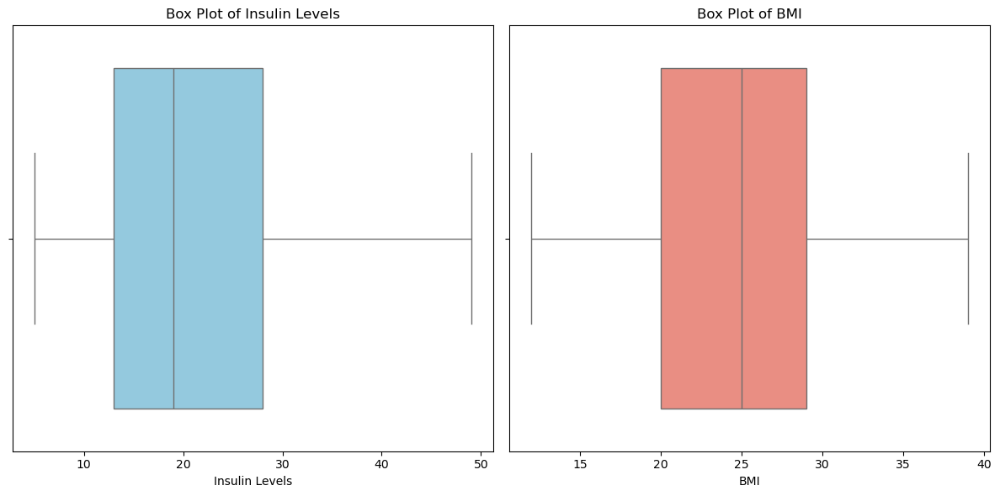

In [17]:
# Creating box plots for Insulin Levels and BMI
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Box plot for Insulin Levels
sns.boxplot(x=df['Insulin Levels'], ax=axs[0], color='skyblue')
axs[0].set_title('Box Plot of Insulin Levels')

# Box plot for BMI
sns.boxplot(x=df['BMI'], ax=axs[1], color='salmon')
axs[1].set_title('Box Plot of BMI')

plt.tight_layout()
plt.show()


<h2 style="font-family: 'Times New Roman', serif; color: #336699; font-weight: bold;">Data Preprocessing</h2>

<h3 style="color: #336699; font-weight: bold;">2.1 Categorical Variable Conversion</h3>

In [20]:
# Convert 'Target' and 'Family History' to categorical
df['Target'] = df['Target'].astype('category')
df['Family History'] = df['Family History'].astype('category')

# Displaying the data types and unique values in categorical columns
print(df.dtypes)
print("Unique values in Target:", df['Target'].unique())
print("Unique values in Family History:", df['Family History'].unique())


Target                           category
Genetic Markers                    object
Autoantibodies                     object
Family History                   category
Environmental Factors              object
Insulin Levels                      int64
Age                                 int64
BMI                                 int64
Physical Activity                  object
Dietary Habits                     object
Blood Pressure                      int64
Cholesterol Levels                  int64
Waist Circumference                 int64
Blood Glucose Levels                int64
Ethnicity                          object
Socioeconomic Factors              object
Smoking Status                     object
Alcohol Consumption                object
Glucose Tolerance Test             object
History of PCOS                    object
Previous Gestational Diabetes      object
Pregnancy History                  object
Weight Gain During Pregnancy        int64
Pancreatic Health                 

<h3 style="color: #336699; font-weight: bold;">2.2 Outlier Removal Based on IQR for Insulin Levels</h3>

In [30]:
Q1_insulin = df['Insulin Levels'].quantile(0.25)
Q3_insulin = df['Insulin Levels'].quantile(0.75)
IQR_insulin = Q3_insulin - Q1_insulin

# Defining the limits for outliers
lower_bound_insulin = Q1_insulin - 1.5 * IQR_insulin
upper_bound_insulin = Q3_insulin + 1.5 * IQR_insulin

# Removing outliers
df_cleaned = df[(df['Insulin Levels'] >= lower_bound_insulin) & (df['Insulin Levels'] <= upper_bound_insulin)]


<h3 style="color: #336699; font-weight: bold;">2.3 Repeat for BMI</h3>

In [33]:
# Repeat for BMI
Q1_bmi = df['BMI'].quantile(0.25)
Q3_bmi = df['BMI'].quantile(0.75)
IQR_bmi = Q3_bmi - Q1_bmi

lower_bound_bmi = Q1_bmi - 1.5 * IQR_bmi
upper_bound_bmi = Q3_bmi + 1.5 * IQR_bmi

# Removing outliers for BMI
df_cleaned = df_cleaned[(df_cleaned['BMI'] >= lower_bound_bmi) & (df_cleaned['BMI'] <= upper_bound_bmi)]

# Verify the new shape of the dataset
print("Original shape:", df.shape)
print("New shape after outlier removal:", df_cleaned.shape)


Original shape: (70000, 34)
New shape after outlier removal: (70000, 34)


<h3 style="color: #336699; font-weight: bold;">2.4 Display Data Types and Unique Values in Categorical Columns</h3>

In [36]:
print(df_cleaned.dtypes)
print("Unique values in Target:", df_cleaned['Target'].unique())
print("Unique values in Family History:", df_cleaned['Family History'].unique())


Target                           category
Genetic Markers                    object
Autoantibodies                     object
Family History                   category
Environmental Factors              object
Insulin Levels                      int64
Age                                 int64
BMI                                 int64
Physical Activity                  object
Dietary Habits                     object
Blood Pressure                      int64
Cholesterol Levels                  int64
Waist Circumference                 int64
Blood Glucose Levels                int64
Ethnicity                          object
Socioeconomic Factors              object
Smoking Status                     object
Alcohol Consumption                object
Glucose Tolerance Test             object
History of PCOS                    object
Previous Gestational Diabetes      object
Pregnancy History                  object
Weight Gain During Pregnancy        int64
Pancreatic Health                 

<h3 style="color: #336699; font-weight: bold;">2.5 One-hot Encoding Categorical Features</h3>

In [39]:
# Convert 'Target' and 'Family History' to categorical
df_cleaned['Target'] = df_cleaned['Target'].astype('category')
df_cleaned['Family History'] = df_cleaned['Family History'].astype('category')

# One-hot encoding categorical features
df_encoded = pd.get_dummies(df_cleaned, columns=['Genetic Markers', 'Autoantibodies', 'Environmental Factors',
                                                 'Physical Activity', 'Dietary Habits', 'Ethnicity',
                                                 'Socioeconomic Factors', 'Smoking Status', 
                                                 'Alcohol Consumption', 'Glucose Tolerance Test',
                                                 'History of PCOS', 'Previous Gestational Diabetes',
                                                 'Pregnancy History', 'Cystic Fibrosis Diagnosis',
                                                 'Steroid Use History', 'Genetic Testing', 
                                                 'Liver Function Tests', 'Urine Test', 
                                                 'Early Onset Symptoms'], drop_first=True)

# Check the new shape and data
print("New shape after encoding:", df_encoded.shape)
df_encoded.head()


New shape after encoding: (70000, 39)


,Target,Family History,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Blood Glucose Levels,Weight Gain During Pregnancy,...,Previous Gestational Diabetes_Yes,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_Yes,Genetic Testing_Positive,Liver Function Tests_Normal,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_Yes
0,Steroid-Induced Diabetes,No,40,44,38,124,201,50,168,18,...,False,True,False,False,True,True,True,False,False,False
1,Neonatal Diabetes Mellitus (NDM),No,13,1,17,73,121,24,178,8,...,False,True,True,False,False,True,False,False,False,True
2,Prediabetic,Yes,27,36,24,121,185,36,105,15,...,False,True,True,False,False,False,True,False,False,True
3,Type 1 Diabetes,No,8,7,16,100,151,29,121,12,...,True,True,True,False,True,False,True,False,False,False
4,Wolfram Syndrome,Yes,17,10,17,103,146,33,289,2,...,True,False,False,False,True,True,False,False,True,False


<h3 style="color: #336699; font-weight: bold;">2.6 Scaling Numerical Features</h3>

In [42]:
# Initialize the scaler
scaler = StandardScaler()

# Selecting numerical columns for scaling
num_cols = ['Insulin Levels', 'Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels',
            'Waist Circumference', 'Blood Glucose Levels', 'Weight Gain During Pregnancy',
            'Pancreatic Health', 'Pulmonary Function', 'Neurological Assessments', 
            'Digestive Enzyme Levels', 'Birth Weight']

# Scaling the numerical features
df_encoded[num_cols] = scaler.fit_transform(df_encoded[num_cols])

# Display the scaled data
df_encoded.head()


,Target,Family History,Insulin Levels,Age,BMI,Blood Pressure,Cholesterol Levels,Waist Circumference,Blood Glucose Levels,Weight Gain During Pregnancy,...,Previous Gestational Diabetes_Yes,Pregnancy History_Normal,Cystic Fibrosis Diagnosis_Yes,Steroid Use History_Yes,Genetic Testing_Positive,Liver Function Tests_Normal,Urine Test_Ketones Present,Urine Test_Normal,Urine Test_Protein Present,Early Onset Symptoms_Yes
0,Steroid-Induced Diabetes,No,1.705261,0.569277,2.197644,0.634773,0.137716,2.197183,0.151527,0.259896,...,False,True,False,False,True,True,True,False,False,False
1,Neonatal Diabetes Mellitus (NDM),No,-0.798037,-1.474156,-1.294096,-1.922277,-1.658739,-1.624429,0.359146,-0.778199,...,False,True,True,False,False,True,False,False,False,True
2,Prediabetic,Yes,0.499969,0.189103,-0.130183,0.484358,-0.221575,0.139392,-1.156471,-0.051533,...,False,True,True,False,False,False,True,False,False,True
3,Type 1 Diabetes,No,-1.261610,-1.189026,-1.460369,-0.568545,-0.985068,-0.889503,-0.824281,-0.362961,...,True,True,True,False,True,False,True,False,False,False
4,Wolfram Syndrome,Yes,-0.427178,-1.046461,-1.294096,-0.418130,-1.097347,-0.301563,2.663714,-1.401056,...,True,False,False,False,True,True,False,False,True,False


<h2 style="color: #336699; font-weight: bold;">Part 3: Model Building and Training</h2>

<h3 style="color: #336699; font-weight: bold;">3.1 Splitting the Data</h3>

In [46]:
#  Splitting the data into features and target
X = df_encoded.drop('Target', axis=1)
y = df_encoded['Target']

# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Displaying the sizes of the splits
print("Training set size:", X_train.shape)
print("Testing set size:", X_test.shape)



Training set size: (56000, 38)
Testing set size: (14000, 38)


<h3 style="color: #336699; font-weight: bold;">3.2 Define Preprocessing for Numerical and Categorical Data</h3>

In [49]:
#  Define numerical and categorical columns explicitly
num_cols = ['Insulin Levels', 'Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels', 
            'Waist Circumference', 'Blood Glucose Levels', 'Weight Gain During Pregnancy', 
            'Pancreatic Health', 'Pulmonary Function', 'Neurological Assessments', 
            'Digestive Enzyme Levels', 'Birth Weight']

#  Define numerical and categorical columns explicitly
num_cols = ['Insulin Levels', 'Age', 'BMI', 'Blood Pressure', 'Cholesterol Levels', 
            'Waist Circumference', 'Blood Glucose Levels', 'Weight Gain During Pregnancy', 
            'Pancreatic Health', 'Pulmonary Function', 'Neurological Assessments', 
            'Digestive Enzyme Levels', 'Birth Weight']

# Specify categorical columns (make sure these are present in your dataset)
cat_cols = ['Ethnicity_Low Risk', 'Socioeconomic Factors_Low', 'Smoking Status_Smoker']

#  Define Preprocessing for Numerical and Categorical Data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),  # Standardizing numerical features
        ('cat', OneHotEncoder(), cat_cols)  # One-hot encoding categorical features
    ]
)

<h3 style="color: #336699; font-weight: bold;">3.3 Create a Pipeline with Preprocessing and Model</h3>

In [52]:
# 5. Create a pipeline with preprocessing and model
model_pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])


<h3 style="color: #336699; font-weight: bold;">3.4 Train the Model</h3>

In [55]:
# 6. Train the model
model_pipeline.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Insulin Levels', 'Age',
                                                   'BMI', 'Blood Pressure',
                                                   'Cholesterol Levels',
                                                   'Waist Circumference',
                                                   'Blood Glucose Levels',
                                                   'Weight Gain During '
                                                   'Pregnancy',
                                                   'Pancreatic Health',
                                                   'Pulmonary Function',
                                                   'Neurological Assessments',
                                                   'Digestive Enzyme Levels',
                                                   'Birth Weight']),
                                                 ('cat', OneHotEncoder(),
                                                  ['Ethnicity_Low Risk',
                                                   'Socioeconomic Factors_Low',
                                                   'Smoking Status_Smoker'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

<h3 style="color: #336699; font-weight: bold;">3.5 Evaluate the Model</h3>

In [57]:
# Evaluate the model
print(f"Training score: {model_pipeline.score(X_train, y_train)}")
print(f"Testing score: {model_pipeline.score(X_test, y_test)}")


Training score: 0.9999821428571428
Testing score: 0.9035714285714286


<h2 style="color: #336699; font-weight: bold;">Part 5: Model Evaluation</h2>

<h3 style="color: #336699; font-weight: bold;">5.1 Make Predictions</h3>

In [58]:
# Make predictions
y_pred = model_pipeline.predict(X_test)

# Classification report
print(classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", cm)

                                            precision    recall  f1-score   support

   Cystic Fibrosis-Related Diabetes (CFRD)       1.00      0.92      0.96      1093
                      Gestational Diabetes       0.90      0.95      0.92      1069
                                      LADA       0.97      0.93      0.95      1044
                                      MODY       0.94      0.84      0.89      1111
          Neonatal Diabetes Mellitus (NDM)       1.00      1.00      1.00      1082
                               Prediabetic       0.96      1.00      0.98      1075
                        Secondary Diabetes       0.80      0.79      0.79      1096
                  Steroid-Induced Diabetes       0.82      0.82      0.82      1055
                           Type 1 Diabetes       0.85      0.98      0.91      1089
                           Type 2 Diabetes       0.90      0.71      0.80      1079
Type 3c Diabetes (Pancreatogenic Diabetes)       0.81      1.00      0.90  

<h3 style="color: #336699; font-weight: bold;">5.2 Visualize Confusion Matrix</h3>

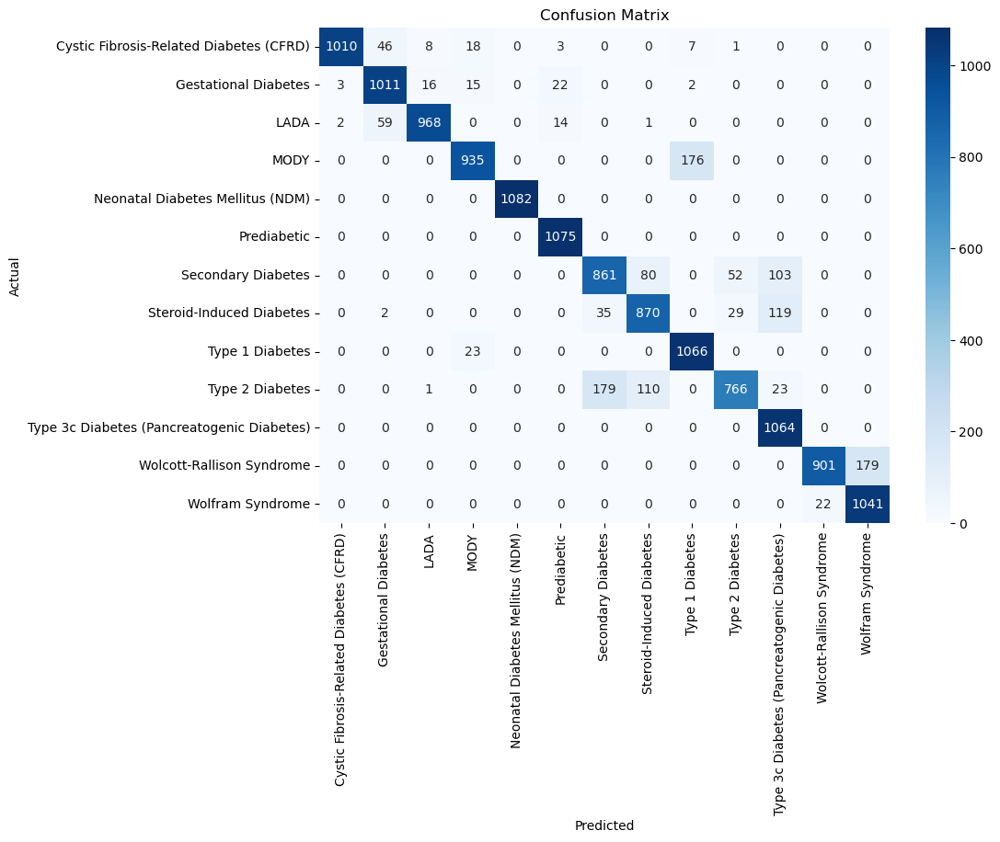

In [60]:
# 14. Confusion Matrix Visualization
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model_pipeline.classes_, yticklabels=model_pipeline.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

<h2 style="color: #336699; font-weight: bold;">Part 6: Feature Importance</h2>

C:\Users\JalalKhan\AppData\Local\Temp\ipykernel_21420\2351082122.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='viridis')


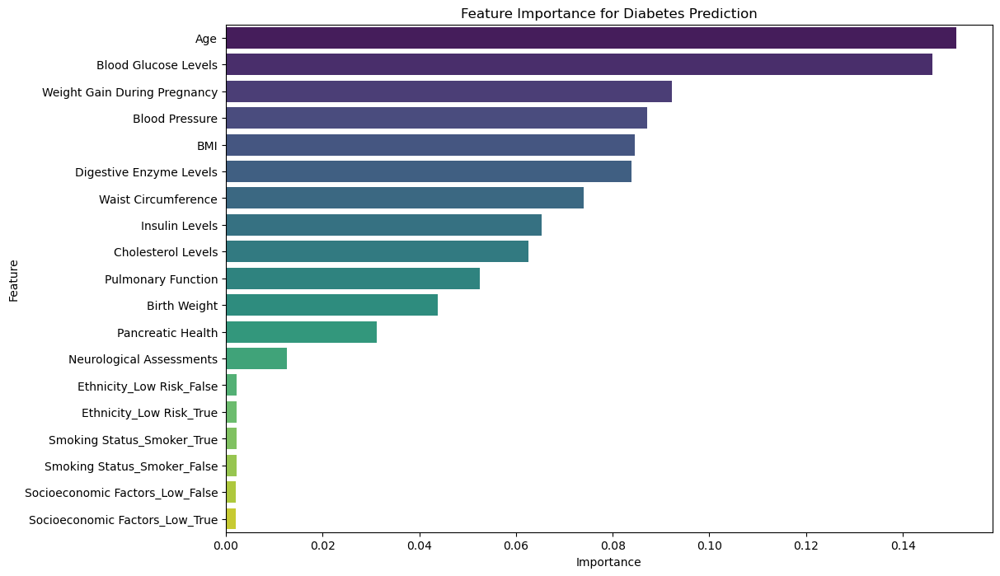

In [62]:
# Get feature importances from RandomForest model
importances = model_pipeline.named_steps['classifier'].feature_importances_

# Combine numerical and one-hot encoded feature names
num_feature_names = num_cols
cat_feature_names = model_pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out()
feature_names = np.concatenate([num_feature_names, cat_feature_names])

# Create DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Plotting feature importance
plt.figure(figsize=(12, 8))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance for Diabetes Prediction')
plt.show()


<h2 style="color: #336699; font-weight: bold;">Part 7: Visualizations</h2>

<h3 style="color: #336699; font-weight: bold;">7.1 Donut Chart for Physical Activity</h3>

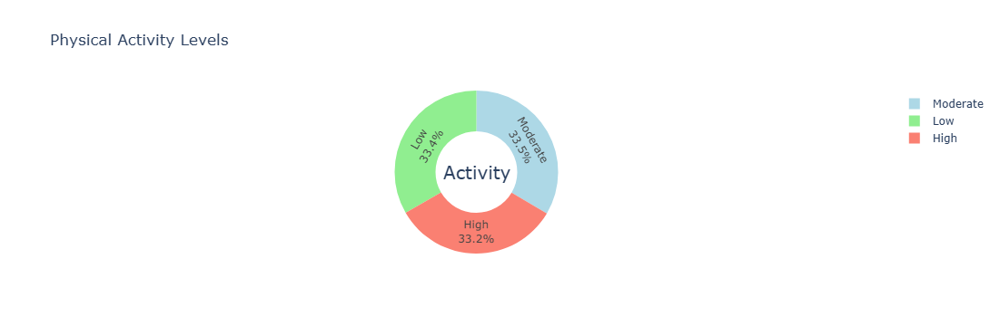

In [65]:
# Donut Chart for Physical Activity
physical_activity_counts = df['Physical Activity'].value_counts()

fig = go.Figure(data=[go.Pie(
    labels=physical_activity_counts.index, 
    values=physical_activity_counts.values, 
    hole=0.5,
    textinfo='label+percent',
    marker_colors=['lightblue', 'lightgreen', 'salmon', 'gold']
)])
fig.update_layout(title_text="Physical Activity Levels", annotations=[dict(text='Activity', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()


<h3 style="color: #336699; font-weight: bold;">7.2 Bar Chart for Count of Each Diabetes Type</h3>

C:\Users\JalalKhan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



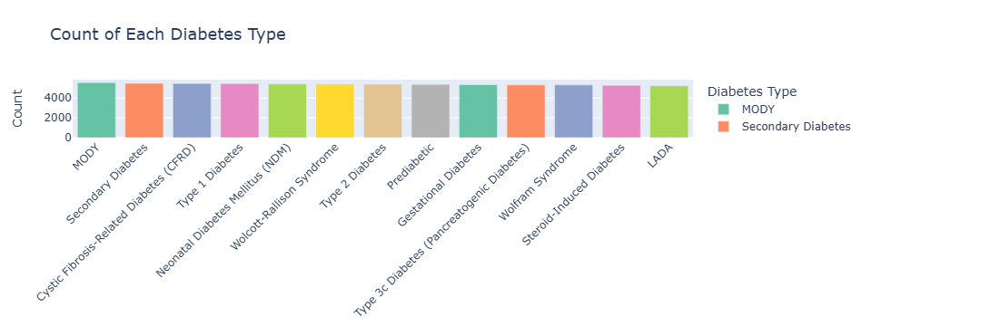

In [67]:
# Bar Chart for Count of Each Diabetes Type

diabetes_count = df['Target'].value_counts().reset_index()
diabetes_count.columns = ['Diabetes Type', 'Count']

fig = px.bar(diabetes_count, x='Diabetes Type', y='Count', color='Diabetes Type', 
             color_discrete_sequence=px.colors.qualitative.Set2,
             title="Count of Each Diabetes Type")
fig.update_layout(xaxis_tickangle=-45, xaxis_title='', yaxis_title='Count', 
                  title_font_size=18)
fig.show()


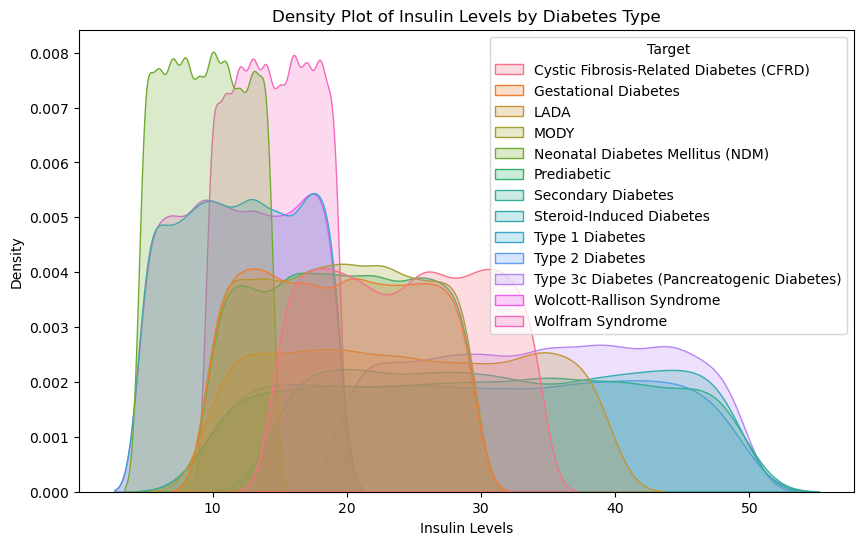

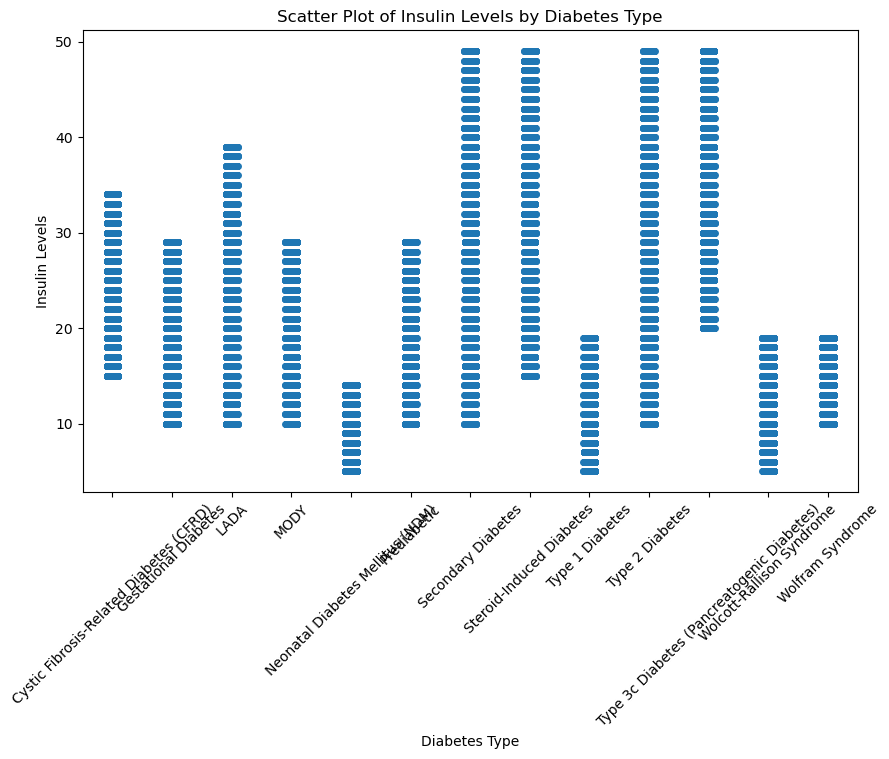

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot 1: Density Plot of Insulin Levels by Target (Diabetes Type)
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x="Insulin Levels", hue="Target", fill=True)
plt.title("Density Plot of Insulin Levels by Diabetes Type")
plt.xlabel("Insulin Levels")
plt.ylabel("Density")
plt.show()

# Plot 2: Scatter Plot of Insulin Levels by Target (Diabetes Type)
plt.figure(figsize=(10, 6))
sns.stripplot(data=df, x="Target", y="Insulin Levels", jitter=True)
plt.title("Scatter Plot of Insulin Levels by Diabetes Type")
plt.xlabel("Diabetes Type")
plt.ylabel("Insulin Levels")
plt.xticks(rotation=45)  # Rotate x-axis labels for readability if needed
plt.show()


<h3 style="color: #336699; font-weight: bold;">7.3 Bar Chart for Average BMI by Diabetes Type</h3>

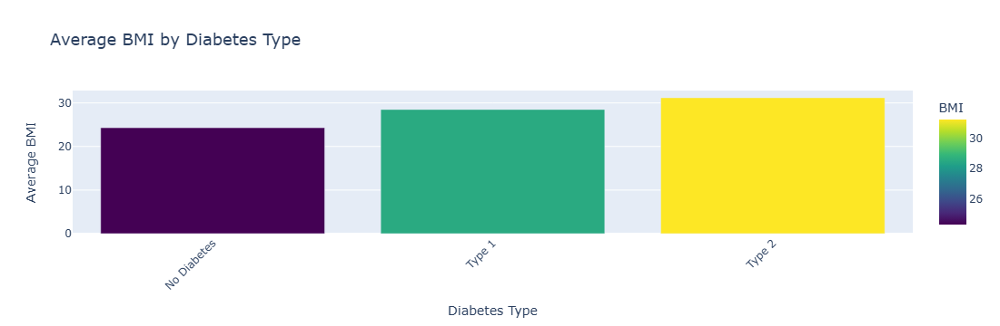

In [74]:
import pandas as pd
import plotly.express as px

# Example data - Replace with your actual data if available
data = pd.DataFrame({
    'Target': ['Type 1', 'Type 2', 'No Diabetes'],
    'BMI': [28.5, 31.2, 24.3]
})

# Calculating average BMI by diabetes type
average_bmi = data.groupby('Target', as_index=False)['BMI'].mean()

# Plotting the bar chart
fig = px.bar(
    average_bmi, 
    x='Target', 
    y='BMI', 
    color='BMI', 
    color_continuous_scale='Viridis', 
    title='Average BMI by Diabetes Type'
)

fig.update_layout(
    xaxis_tickangle=-45, 
    xaxis_title='Diabetes Type',
    yaxis_title='Average BMI', 
    title_font_size=18
)

fig.show()


<h3 style="color: #336699; font-weight: bold;">7.4 3D Scatter Plot</h3>

C:\Users\JalalKhan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



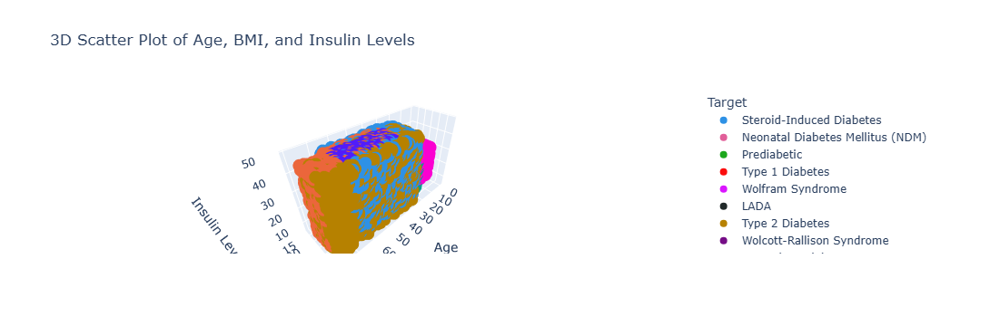

In [76]:
# 3D Scatter Plot Of Age, BMI, & Insulin Levels
fig = px.scatter_3d(df, x='Age', y='BMI', z='Insulin Levels', 
                    color='Target', 
                    color_discrete_sequence=px.colors.qualitative.Dark24, 
                    title='3D Scatter Plot of Age, BMI, and Insulin Levels')
fig.update_layout(scene=dict(xaxis_title='Age', yaxis_title='BMI', zaxis_title='Insulin Levels'))
fig.show()


<h3 style="color: #336699; font-weight: bold;">7.5 2D Density Plot of Blood Glucose Levels vs Insulin Levels</h3>

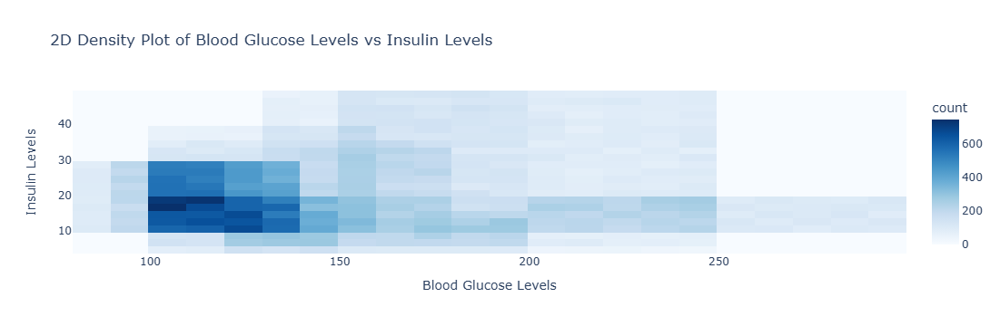

In [78]:
# Using density_heatmap to create a 2D density plot
fig = px.density_heatmap(df, x='Blood Glucose Levels', y='Insulin Levels',
                         title='2D Density Plot of Blood Glucose Levels vs Insulin Levels',
                         color_continuous_scale='Blues')

# Show the plot
fig.show()


<h3 style="color: #336699; font-weight: bold;">7.6 Pair plot of Key Features by Diabetes Type</h3>

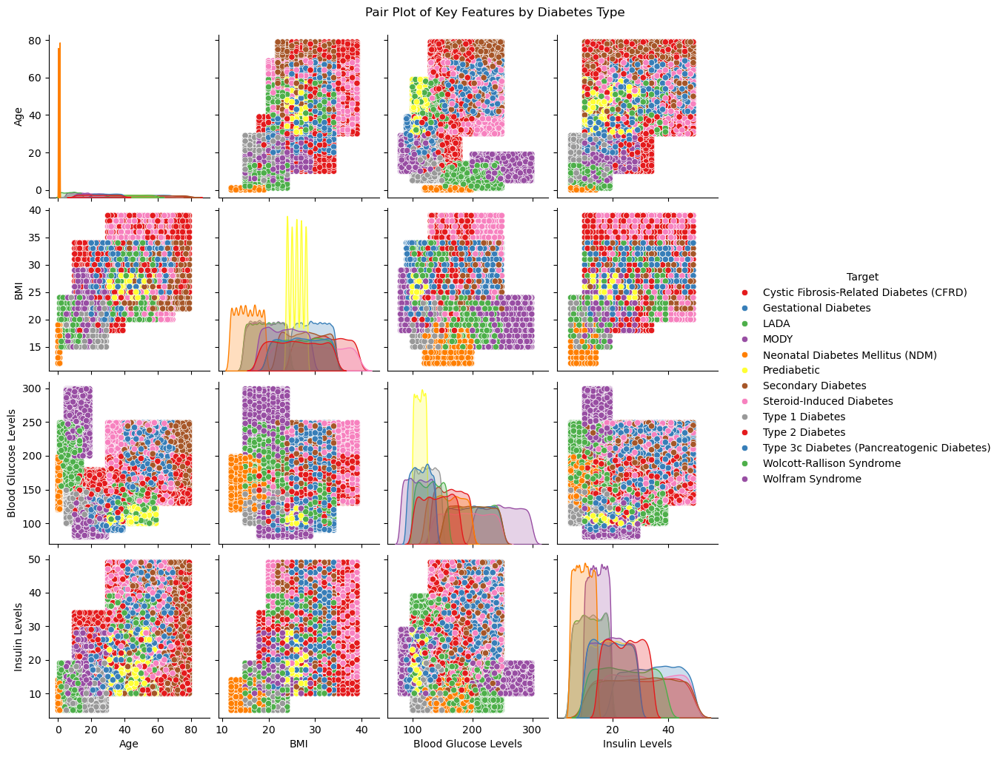

In [82]:
# Pair plot of Key Features by Diabetes Type
sns.pairplot(df, vars=['Age', 'BMI', 'Blood Glucose Levels', 'Insulin Levels'], hue='Target', palette='Set1')
plt.suptitle('Pair Plot of Key Features by Diabetes Type', y=1.02)
plt.show()

<h3 style="color: #336699; font-weight: bold;">7.7 Time-series plot for Blood Glucose Levels Age Groups</h3>

C:\Users\JalalKhan\anaconda3\Lib\site-packages\plotly\express\_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



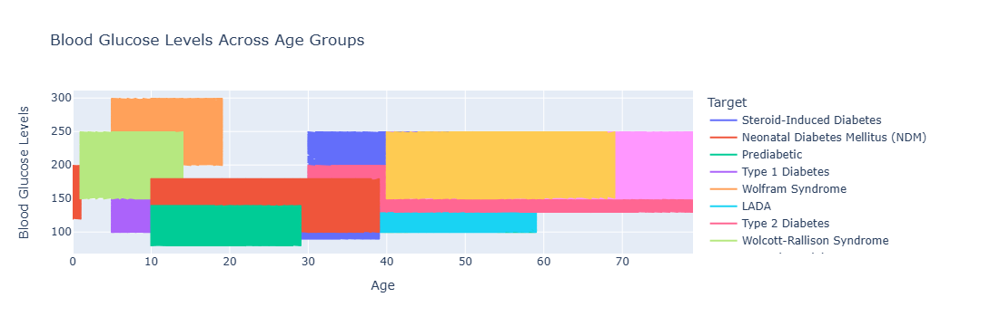

In [81]:
# Time-series plot for Blood Glucose Levels Age Groups
fig = px.line(df, x='Age', y='Blood Glucose Levels', color='Target', 
              title='Blood Glucose Levels Across Age Groups')
fig.show()
